<a href="https://colab.research.google.com/github/baamvu/Vietnam-Traffic-Sign-Recognition/blob/master/YOLOv5_Traffic_Signs_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Tải yolov5, import thư viện và cuda

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output # to display images
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 17842, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 17842 (delta 23), reused 6 (delta 6), pack-reused 17806 (from 3)
Receiving objects: 100% (17842/17842), 16.97 MiB | 20.68 MiB/s, done.
Resolving deltas: 100% (12157/12157), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 37.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.6/131.6 kB 17.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.8/95.8 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 24.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 69.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 121.6 MB/s eta 0:00:00
Setup complete. Using torch 2.10.0+cu128 (Tesla T4)


## Truy cập tới API cá nhân của Roboflow

In [ ]:
api_key = "nem4y7IagBKhlPKqH0yb"
from roboflow import Roboflow
rf = Roboflow(api_key=api_key, model_format="yolov5", notebook="ultralytics")

In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

## Truy cập tới dataset của nhóm trên Roboflow

In [ ]:
project = rf.workspace("quoxbau").project("vietnamese-traffic-sign-bihit-zmkpm")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/Vietnamese-Traffic-Sign-1 in yolov5pytorch:: 100%|██████████| 5076/5076 [00:03<00:00, 1632.41it/s]


## Train mô hình với 100 epochs

In [ ]:
import os
os.environ['WANDB_DISABLED'] = 'true'

In [ ]:
!python train.py --img 416 --batch 64 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache --workers 2

Streaming output truncated to the last 5000 lines.
      19/99      7.49G    0.02848   0.007745     0.0394        137        416:  21% 6/28 [00:02<00:09,  2.32it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      19/99      7.49G    0.02847   0.007853    0.03952        177        416:  25% 7/28 [00:03<00:09,  2.30it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      19/99      7.49G    0.02877    0.00795    0.03906        171        416:  29% 8/28 [00:03<00:08,  2.33it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      19/99      7.49G    0.02883   0.00

## Vẽ sơ đồ thống kê bằng TensorBoard
(sơ đồ thống kê có thể được tìm thấy ở địa chỉ `yolov5/runs/train`)

In [ ]:
#Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## Test ảnh trong tập test sử dụng file weight `best.pt` vừa mới train

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.2 --source {dataset.location}/valid/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/Vietnamese-Traffic-Sign-1/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-461-gda75ed9d Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
Model summary: 157 layers, 7212400 parameters, 0 gradients, 16.4 GFLOPs
image 1/507 /content/datasets/Vietnamese-Traffic-Sign-1/valid/images/IMG20240110184459-Custom-_jpg.rf.80fb360d7307070d89431d6c8b9ba383.jpg: 416x416 1 W.207a, 1 W.207b, 7.4ms
image 2/507 /content/datasets/Vietnamese-Traffic-Sign-1/valid/images/IMG20240110185926-Custom-_jpg.rf.4

## Hiện 20 ảnh vừa mới test

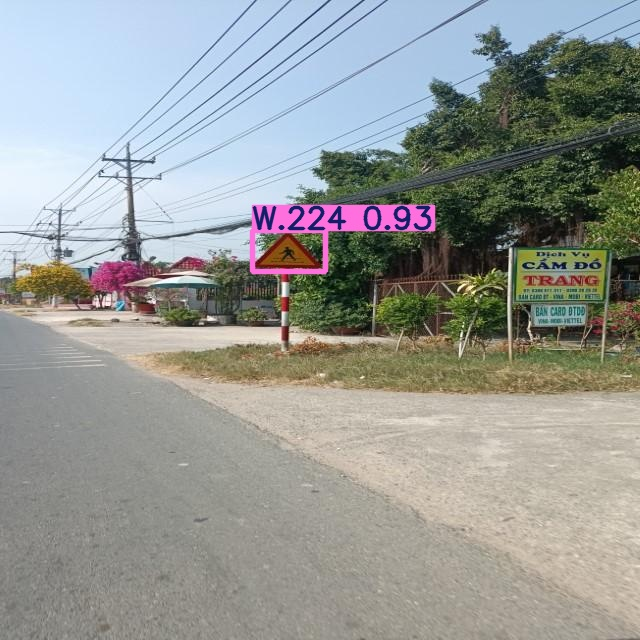

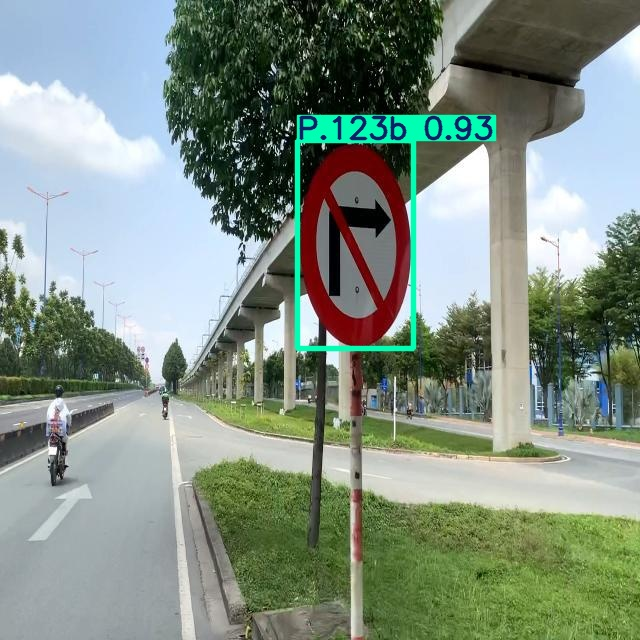

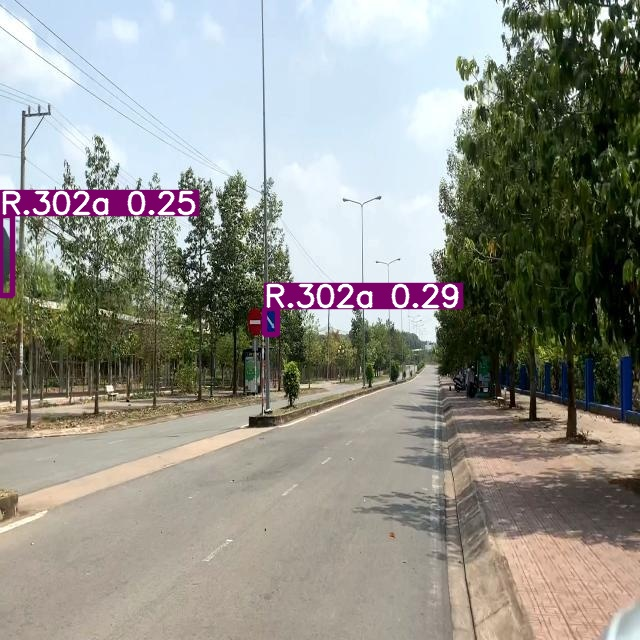

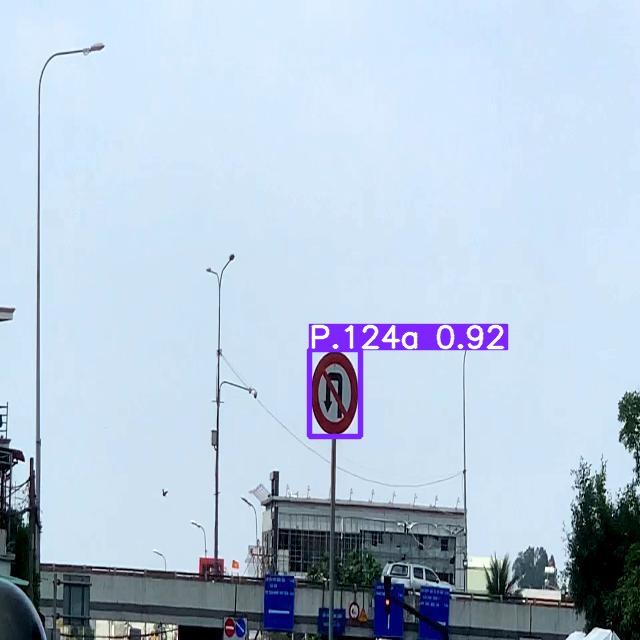

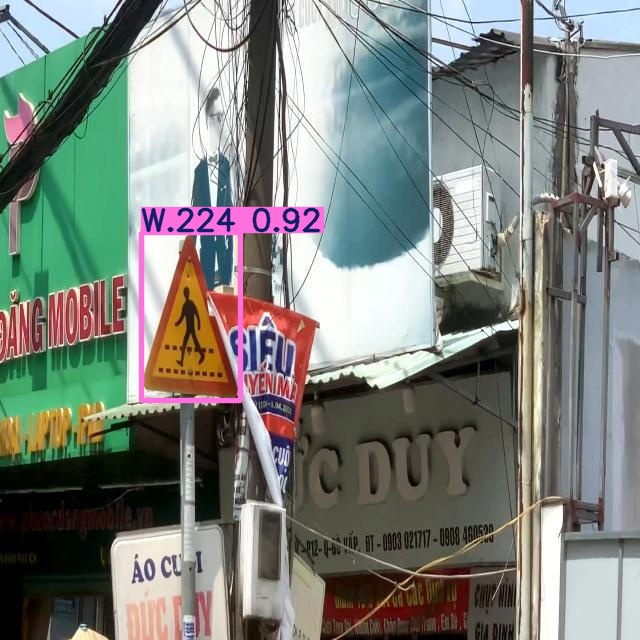

...

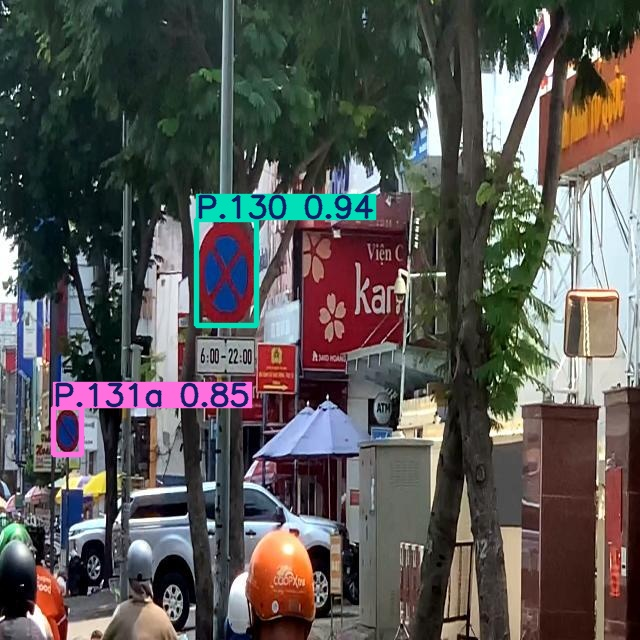

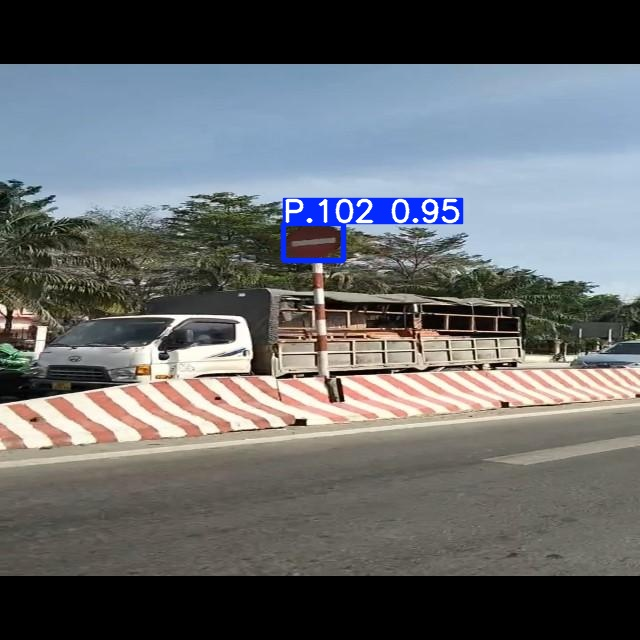

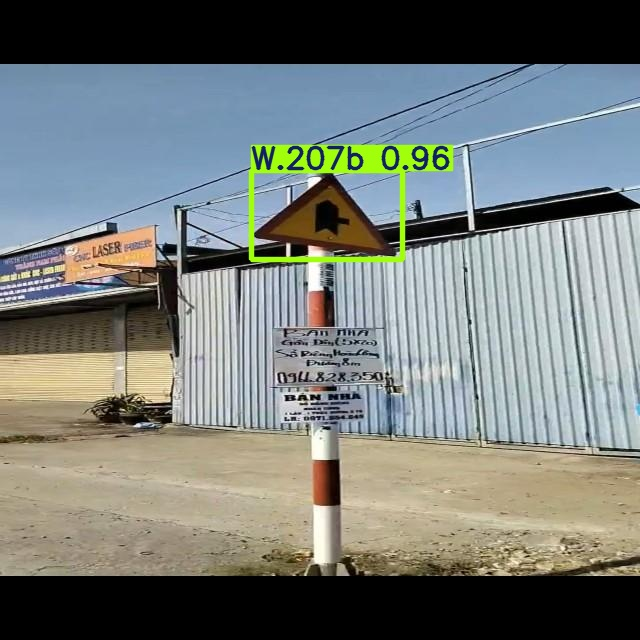

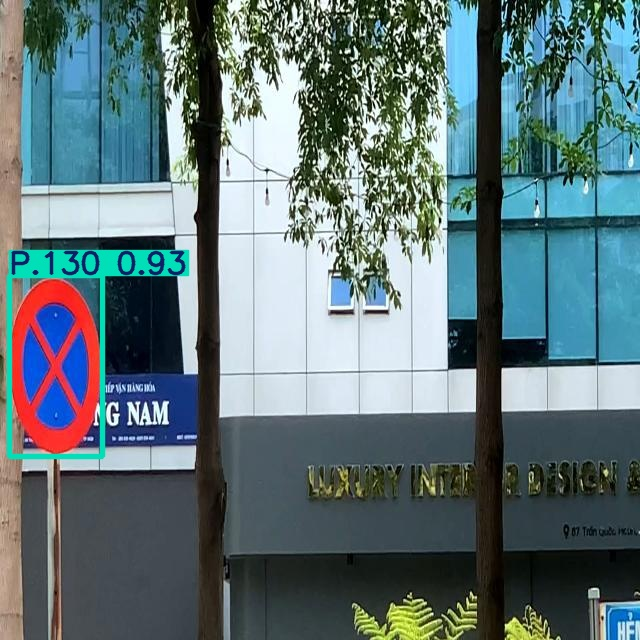

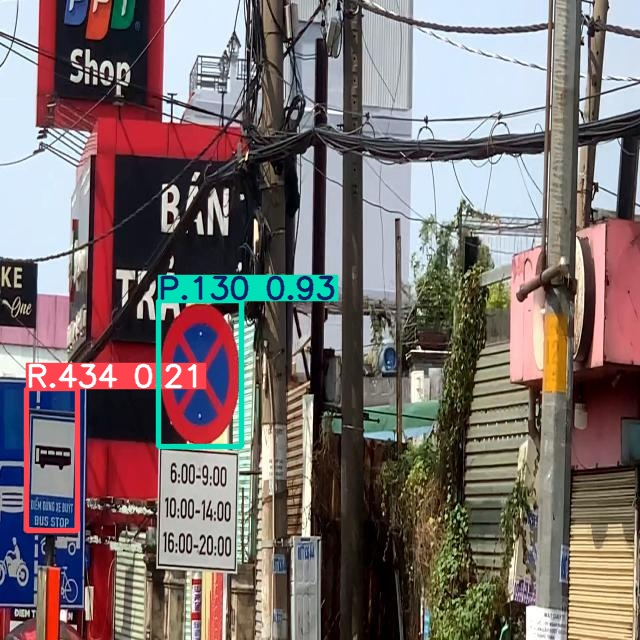

In [ ]:
#display inference on ALL test images
import glob
from IPython.display import Image, display
i = 0
# Choose the correct exp folder - see prev output block
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
  i += 1
  if i < 20:
    display (Image(filename=imageName))
    print("\n")

## Test video từ bên ngoài sử dụng file weight `best.pt` vừa mới train

In [ ]:
!python detect.py --weights '/content/best.pt' --img 416 --conf 0.2 --source '/content/video2.mp4'